In [11]:
from __future__ import print_function
%load_ext autoreload
%autoreload 2
from pixell import enmap, utils
from pixell import reproject
from pixell import enplot
import numpy as np
import matplotlib.pyplot as plt
import PIL
from glob import glob
from astropy.io import fits
import time, sys
from IPython.display import clear_output
from matplotlib import rc
rc('text', usetex=True)
rc('font', family='serif')
rc('font',size=16)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [12]:
def progress_bar(progress):
    bar_length = 20
    if isinstance(progress, int):
        progress = float(progress)
    if not isinstance(progress, float):
        progress = 0
    if progress < 0:
        progress = 0
    if progress >= 1:
        progress = 1
        
    block = int(round(bar_length * progress))
    clear_output(wait = True)
    text = "Progress: [{0}] {1:.1f}%".format( "#" * block + "-" * (bar_length - block), progress * 100)
    print(text)

In [2]:
# Convenient wrapper for displaying enmaps
def eshow(x,**kwargs): enplot.show(enplot.plot(x,**kwargs))

In [3]:
path = '/lustre/aoc/projects/hera/H1C_IDR2/IDR2_2/2458098/'
fitsfiles = glob(path+'zen.*.HH.calibrated.uvh5_image/*image.image.fits')
fitsfiles.sort()

In [33]:
# Define some dimensions
fitsfile = fitsfiles[0]
# Read the map
imap = enmap.read_map(fitsfile,)
# For some reason, pixell makes it really hard to get at the actual values in the WCS header
hdu = fits.open(fitsfile)
# Define the size of the pixels in the uber-map as a fraction of the size of the original map
pix_fac = 2.
pixsize_new = np.abs(imap.wcs.pixel_scale_matrix[0][0])*60./pix_fac * utils.arcmin

In [58]:
# Need to trim mastermap ... a lot
# Figure out the extents
for ifile,fitsfile in enumerate(fitsfiles):
    progress_bar(ifile/nmaps)
    hdu = fits.open(fitsfile)
    # Extract a postage stamp centered on the center of the image
    dec0, ra0 = np.deg2rad(np.array((hdu[0].header['CRVAL2'],hdu[0].header['CRVAL1'])))
    width = np.deg2rad(20.)
    # [[decfrom,rafrom],[[decto,rato]]
    this_decfrom = dec0-width/2.
    this_rafrom = ra0-width/2.
    this_decto = dec0+width/2.
    this_rato = ra0+width/2.
    if ifile == 0:
        decfrom = this_decfrom
        rafrom = this_rafrom
        decto = this_decto
        rato = this_rato
    else:
        if this_decfrom < decfrom:
            decfrom = this_decfrom
        if this_rafrom < rafrom:
            rafrom = this_rafrom
        if this_decto > decto:
            decto = this_decto
        if this_rato > rato:
            rato = this_rato
            
print(np.rad2deg([decfrom,decto]))
print(np.rad2deg([rafrom,rato]))

Progress: [####################] 98.2%
[-40.81722485 -20.6368781 ]
[ -6.37246825 161.69223872]


In [78]:
# Define the master map
# Define its shape
shape_band, wcs_band = enmap.band_geometry(np.radians([-60,-10]), 
                                           res=pixsize_new, proj='car') #shape=shape_fullsky, proj='car')
print(shape_band)
print(wcs_band)
mastermap = enmap.enmap(np.zeros([4,1,shape_band[0],shape_band[1]]), wcs=wcs_band).submap([[decfrom,rato],[decto,rafrom]])
shape_band = mastermap.shape
wcs_band = mastermap.wcs
print(shape_band)
print(wcs_band)

(720, 5184)
car:{cdelt:[-0.06944,0.06944],crval:[0,0],crpix:[2593,865]}
(4, 1, 291, 2420)
car:{cdelt:[-0.06944,0.06944],crval:[0,0],crpix:[2329,589]}


In [80]:
nmaps = len(fitsfiles)
nfreq = 1

In [81]:
# Note the reversed order
nstokes, nfreq, ny, nx = shape_band

In [82]:
# Note that pixell wants last two trailing dimensions to be the ones associated with the WCS; 
# the others are arbitrary
pStokes = enmap.enmap(np.zeros([4,nfreq,nmaps,ny,nx]), wcs=wcs_band)

In [83]:
pStokes.shape

(4, 1, 56, 291, 2420)

In [84]:
imap.shape

(4, 1, 512, 512)

In [86]:
for ifile,fitsfile in enumerate(fitsfiles):
    progress_bar(ifile/nmaps)
    # Read file into pixell object
    imap = enmap.read_map(fitsfile,)
    # Extract a postage stamp centered on the center of the image
    hdu = fits.open(fitsfile)
    dec0, ra0 = np.deg2rad(np.array((hdu[0].header['CRVAL2'],hdu[0].header['CRVAL1'])))
    width = np.deg2rad(20.)
    box = np.array([[dec0-width/2.,ra0-width/2.],[dec0+width/2.,ra0+width/2.]])
 
    stamp = imap.submap(box)
    
    # project the stamp into the master grid
    stampmap = enmap.project(stamp, shape_band, wcs_band)
    
    # Store all the stamps
    pStokes[:,:,ifile,:,:] = stampmap
    
    # Accumulate
    mastermap += stampmap

Progress: [####################] 98.2%


In [87]:
# We get all 4 Stokes parameters at one go
mastermap.shape

(4, 1, 291, 2420)

In [107]:
# write the output back to fits
enmap.write_fits('mastermap.fits', mastermap)

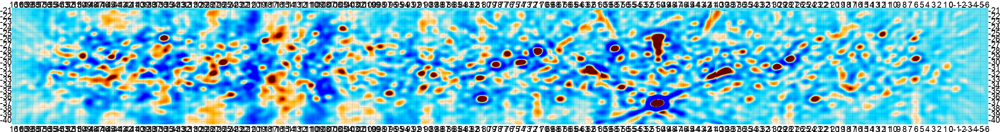

In [88]:
eshow(mastermap[0,0,:,:])

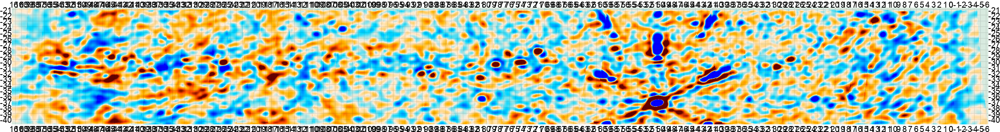

In [89]:
eshow(mastermap[1,0,:,:])

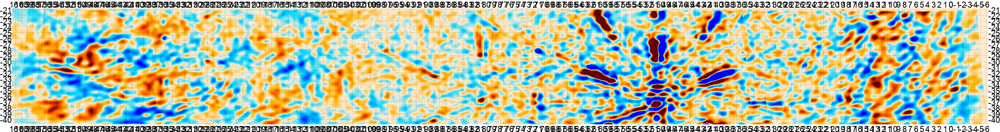

In [90]:
eshow(mastermap[2,0,:,:])

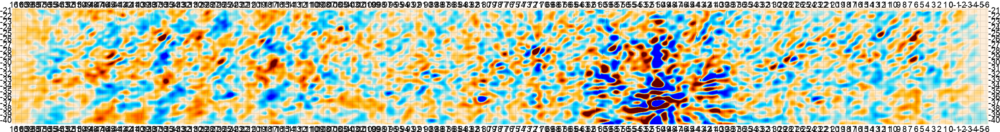

In [91]:
eshow(mastermap[3,0,:,:])

In [92]:
# Do the maps make sense?
pStokes.shape

(4, 1, 56, 291, 2420)

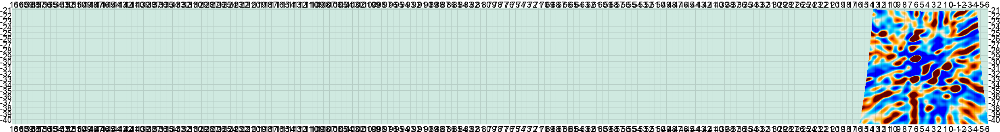

In [93]:
eshow(pStokes[0,0,0,:,:])

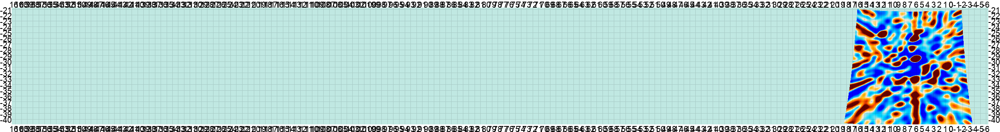

In [95]:
eshow(pStokes[0,0,1,:,:])

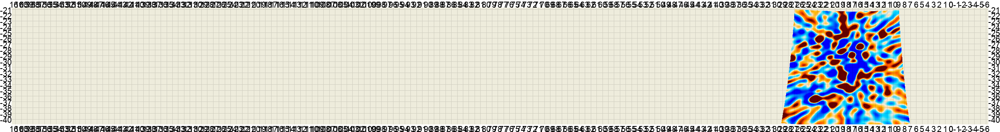

In [96]:
eshow(pStokes[0,0,5,:,:])

In [98]:
# Now ... how to build Mueller
muellermodel = '/lustre/aoc/projects/hera/gtucker/notebooks/muellerbeam.fits'
hdu = fits.open(muellermodel)
mueller_data = hdu[0].data
# Define the pixell map stack ...
Mueller = enmap.enmap(np.zeros([4,4,nfreq,nmaps,ny,nx]), wcs=wcs_band)

In [99]:
mueller_data.shape

(4, 4, 1, 512, 512)

In [100]:
# The trick here is to use the wcs information from each file you read in to define the Mueller matrix
for ifile,fitsfile in enumerate(fitsfiles):
    progress_bar(ifile/nmaps)
    # Read file into pixell object
    imap = enmap.read_map(fitsfile,)
    # Extract a postage stamp centered on the center of the image
    hdu = fits.open(fitsfile)
    dec0, ra0 = np.deg2rad(np.array((hdu[0].header['CRVAL2'],hdu[0].header['CRVAL1'])))
    width = np.deg2rad(20.)
    box = np.array([[dec0-width/2.,ra0-width/2.],[dec0+width/2.,ra0+width/2.]])
 
    this_mueller = enmap.enmap(mueller_data, wcs = imap.wcs)

    mueller_stamp = this_mueller.submap(box)
    
    # project the stamp into the master grid
    mueller_stampmap = enmap.project(mueller_stamp, shape_band, wcs_band)
    
    # Store all the stamps
    Mueller[:,:,:,ifile,:,:] = mueller_stampmap

Progress: [####################] 98.2%


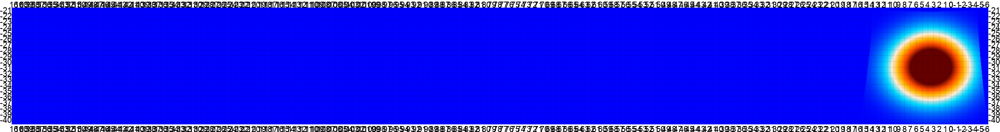

In [101]:
eshow(Mueller[0,0,0,0,:,:])

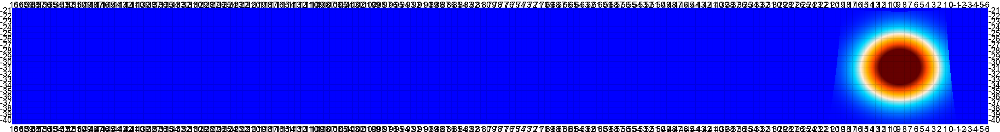

In [102]:
eshow(Mueller[0,0,0,2,:,:])

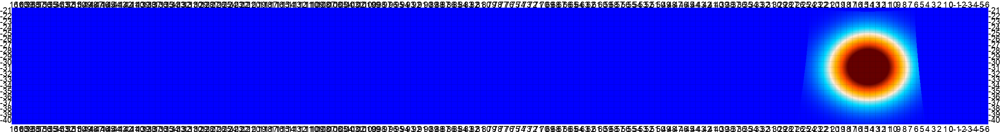

In [103]:
eshow(Mueller[0,0,0,4,:,:])

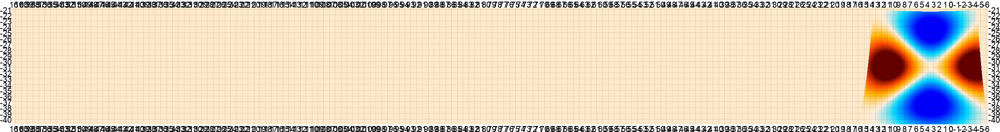

In [105]:
eshow(Mueller[0,1,0,0,:,:])

In [153]:
ndata = 4*nmaps

In [154]:
# We will probably always assume W is diagonal; but there might be noise correlation between the pseudo-Stokes ... ? 
W = np.eye(ndata)
print(W.shape)

(224, 224)


In [ ]:
Stokes = enmap.enmap(np.zeros(mastermap.shape), wcs = mastermap.wcs)
# There's probably a faster way, but the brute force approach is to construct the linear combination at every pixel
npix = 0
xrange = np.arange(nx)
yrange = np.arange(ny)
failed = 0
t0 = time.time()
for inx in xrange:
    progress_bar(npix/(len(xrange)*len(yrange)))
    for iny in yrange:
        npix += 1
        # Construct A and the data
        A = np.zeros([ndata,4])
        d = np.zeros([ndata])
        for imap in np.arange(nmaps):
            indx = np.arange(imap*4, (imap+1)*4)
            A[indx, :] = Mueller[:, :, 0, imap, iny, inx]
            d[indx] = pStokes[:, 0, imap, iny, inx]
        #ATWd = np.matmul(A.T, np.matmul(W,d))
        ATWd = np.matmul(A.T, d)
        #Cov = np.matmul(A.T, np.matmul(W, A))
        Cov = np.matmul(A.T, A)
        # Need to think about computing the condition number and the inversion method here
        try:
            invCov = np.linalg.inv(Cov)
            bestfit = np.matmul(invCov, ATWd)
        except:
            bestfit = np.array([np.nan, np.nan, np.nan, np.nan])
            failed += 1
        Stokes[:,0,iny,inx] = bestfit  
t1 = time.time()
print('Elapsed time',t1-t0,'seconds')

Progress: [##------------------] 10.2%


In [182]:
ATWd

array([-0.29685364,  0.08897673, -0.08492272, -0.01140966])

In [191]:
def printCov(C):
    for i in np.arange(4):
        for j in np.arange(4):
            a = C[i,j]
            print(f'{a:.2g}',end="  ")
        print()

printCov(invCov)

8.6  3  -0.006  -0.11  
3  8.9  -0.0063  -0.018  
-0.006  -0.0063  8.1  0.0058  
-0.11  -0.018  0.0058  8.4  


In [192]:
print(bestfit)

[-2.29595462 -0.08608007 -0.68945417 -0.06698455]


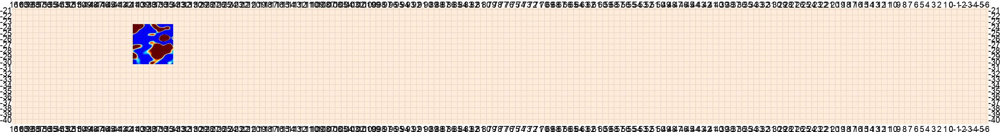

In [174]:
eshow(Stokes[0,0,:,:])

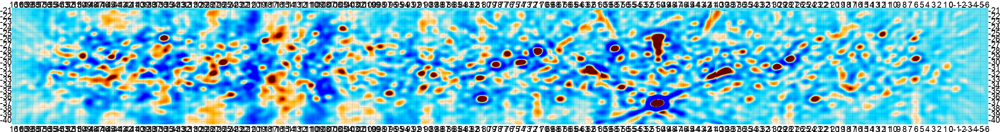

In [171]:
eshow(mastermap[0,0,:,:])

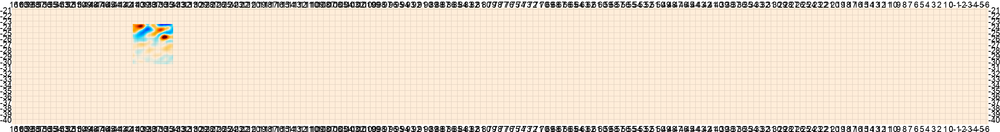

In [175]:
eshow(Stokes[1,0,:,:])

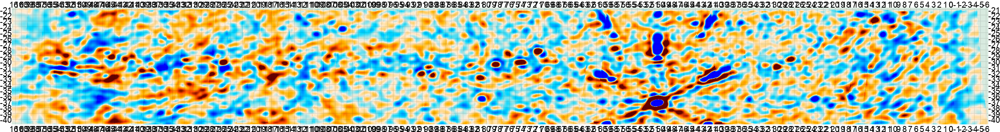

In [176]:
eshow(mastermap[1,0,:,:])

In [156]:
npix = 0

In [157]:
npix++

SyntaxError: invalid syntax (<ipython-input-157-4a818aa983f4>, line 1)